In [1]:
from wordcloud import WordCloud, STOPWORDS
import pandas as pd
import matplotlib.pyplot as plt

In [4]:
frames = []
usernames = ["JustinTrudeau","ElizabethMay","AndrewScheer","MaximeBernier","theJagmeetSingh"]
for username in usernames:
    file_path = "../data/{}_data.csv".format(username)
    timeline_df = pd.read_csv(file_path)
    frames.append(timeline_df)
total_df = pd.concat(frames,sort=False).sample(frac=1) 
total_df.head(3)  

,id,created_at,source,favorite_count,retweet_count,original_author,type,clean_text,original_text,lda_cluster
443,1166085560957636614,Mon Aug 26 20:30:37 +0000 2019,"<a href=""https://mobile.twitter.com"" rel=""nofo...",535,95,JustinTrudeau,tweet,month canada-eu summit montreal eucopresident ...,Just over a month after the Canada-EU Summit i...,3
1282,1088064743598895104,Wed Jan 23 13:23:44 +0000 2019,"<a href=""http://twitter.com/download/iphone"" r...",490,185,MaximeBernier,tweet,debate nutrition hijacked decade dairy cartel ...,Our debates about nutrition have been hijacked...,5
751,1133711592007319552,Wed May 29 12:28:01 +0000 2019,"<a href=""http://twitter.com/download/iphone"" r...",862,433,MaximeBernier,tweet,last night senate adopted c-71 another liberal...,"Last night, the Senate adopted C-71, another L...",2


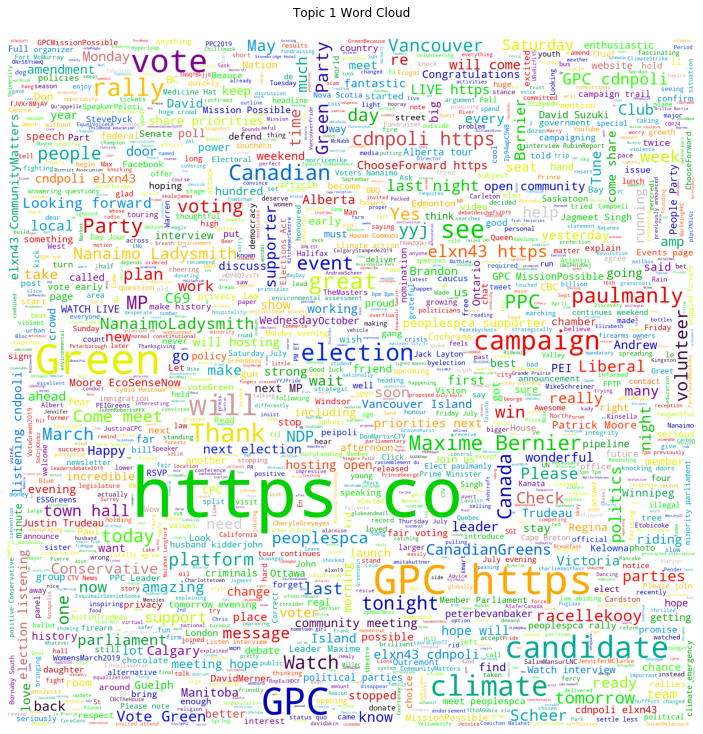

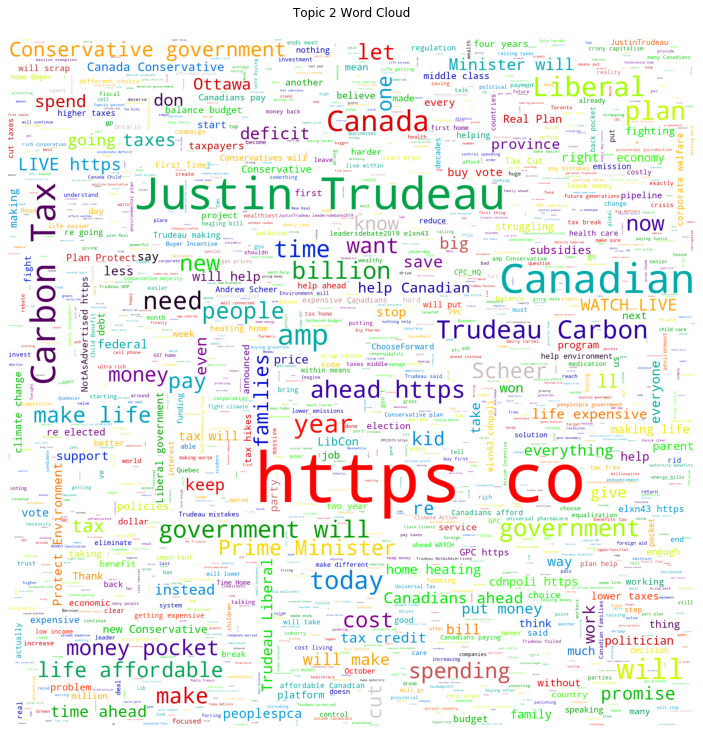

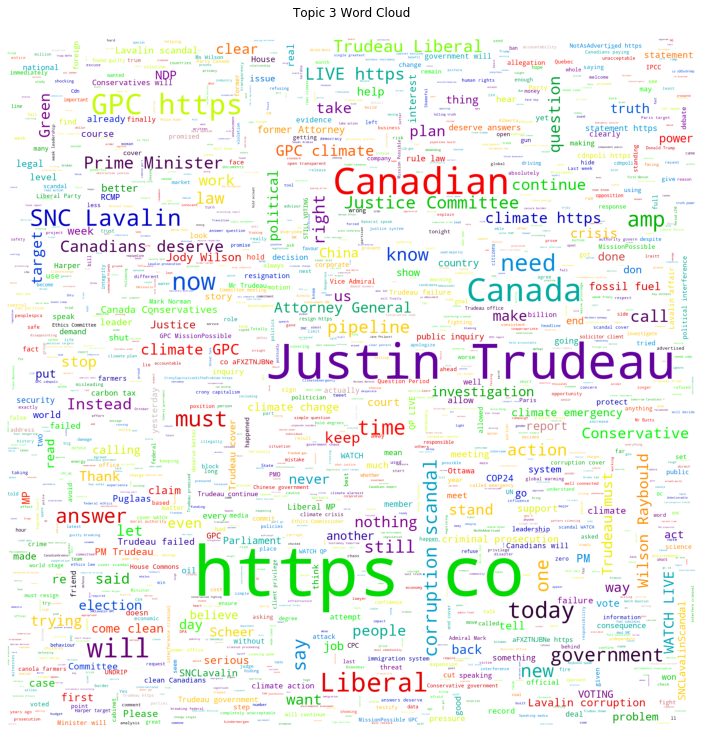

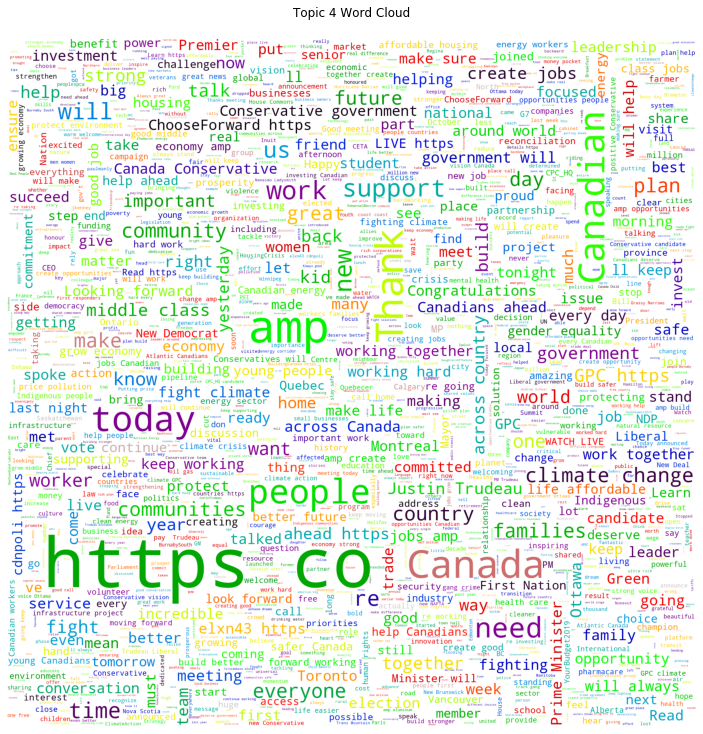

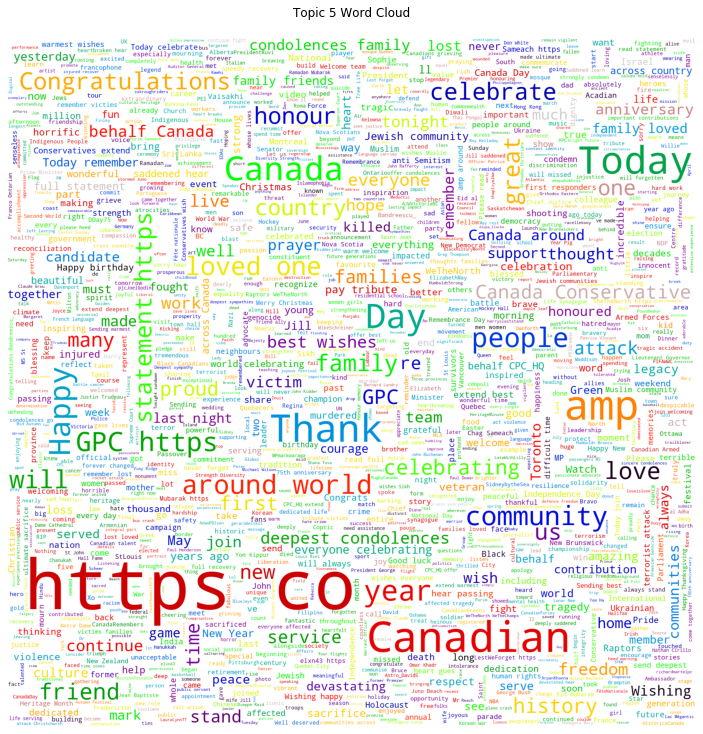

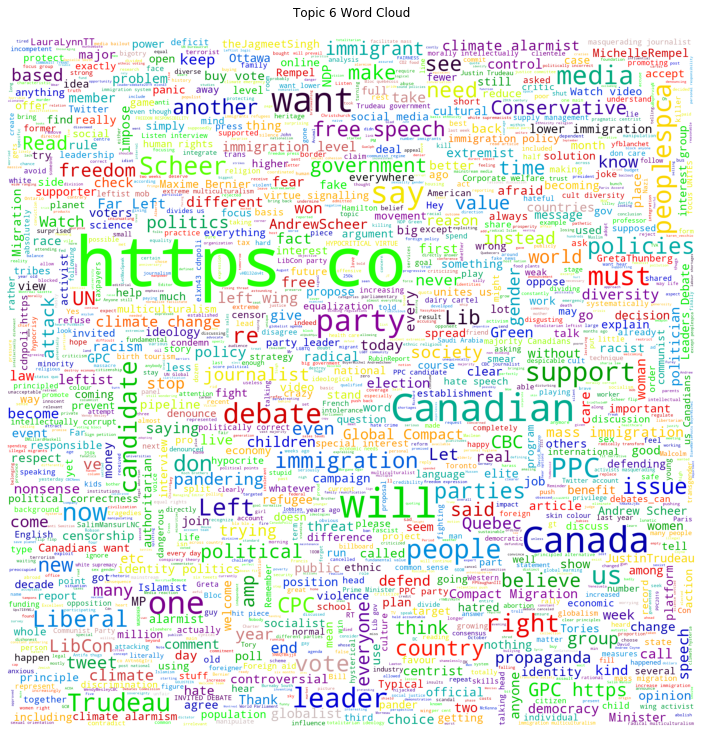

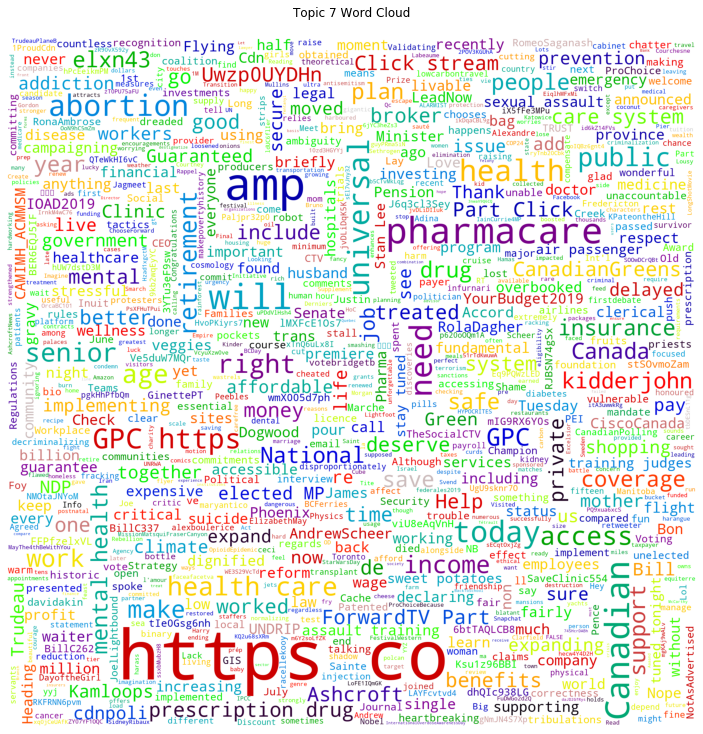

In [7]:
for topic in range(len(total_df["lda_cluster"].unique())-1):
    text = total_df[total_df["lda_cluster"]==topic]['clean_text']
    word_cloud = WordCloud(width=2000, height=2000, max_font_size=200, background_color="white", max_words=1500,
                        colormap="nipy_spectral", stopwords=STOPWORDS).generate(' '.join(text))
    plt.figure(figsize=(10, 10))
    plt.imshow(word_cloud, interpolation="hermite")
    plt.title("Topic {} Word Cloud\n".format(topic+1))
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.savefig("../visualizations/wordclouds/test_topic_{}_wordcloud.png".format(topic+1))